# Community Detection - Lab

## Introduction

In this lab, you'll once again work to cluster a network dataset. This time, you'll be investigating a meetup dataset for events occurring in Nashville.

## Objectives

You will be able to:
* Cluster a social network into subgroups

## Load the Dataset

To start, load the dataset `'nashville-meetup/group-edges.csv'` as a pandas Dataframe. 

In [36]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

df = pd.read_csv('nashville-meetup/group-edges.csv', index_col='Unnamed: 0')
df.astype('int64').dtypes
df.head()

,group1,group2,weight
0,19292162,535553,2
1,19292162,19194894,1
2,19292162,19728145,1
3,19292162,18850080,2
4,19292162,1728035,1


To add some descriptive data, import the file `'nashville-meetup/meta-groups.csv'`.

In [37]:
df_meta = pd.read_csv('nashville-meetup/meta-groups.csv')
df_meta.head()

,group_id,group_name,num_members,category_id,category_name,organizer_id,group_urlname
0,339011,Nashville Hiking Meetup,15838,23,Outdoors & Adventure,4353803,nashville-hiking
1,19728145,Stepping Out Social Dance Meetup,1778,5,Dancing,118484462,steppingoutsocialdance
2,6335372,Nashville soccer,2869,32,Sports & Recreation,108448302,Nashville-soccer
3,10016242,NashJS,1975,34,Tech,8111102,nashjs
4,21174496,20's & 30's Women looking for girlfriends,2782,31,Socializing,184580248,new-friends-in-Nashville


In [38]:
# for i in df.index:
#     df.group1[i] = df_meta.group_name[df_meta.index == df.group1[i]].values[0]
#     df.group2[i] = df_meta.group_name[df_meta.index == df.group2[i]].values[0]

## Transform to a Network Representation

Take the Pandas DataFrame and transform it into a graph representation via NetworkX. Make nodes the names of the various groups within the Nashville area. The edges should be the weights between these groups.

In [51]:
G = nx.Graph()
for row in df.index:
    source = df_meta.group_name[df_meta.group_id == df.group1[row]].values[0]
    target = df_meta.group_name[df_meta.group_id == df.group2[row]].values[0]
    weight = df.weight[row]
    G.add_edge(source, target, weight=weight)

## Visualize the Network

C:\Users\Matthew Parker\.conda\envs\learn-env\lib\site-packages\networkx\drawing\nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


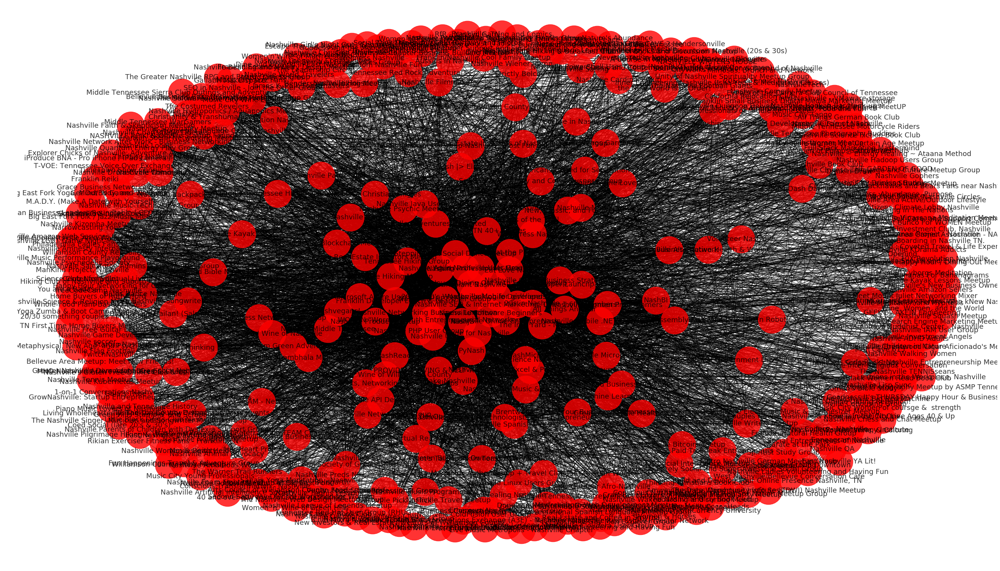

In [52]:
plt.figure(figsize=(35,20))
nx.draw(G, pos=nx.spring_layout(G, k=2, seed=10), with_labels=True,
        alpha=.8, node_size=5000, font_size=18);

## Refine the Visual

As you should see, the initial visualization is a globular mess! Refine the visualization to better picture the center core of the  network.

C:\Users\Matthew Parker\.conda\envs\learn-env\lib\site-packages\networkx\drawing\nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


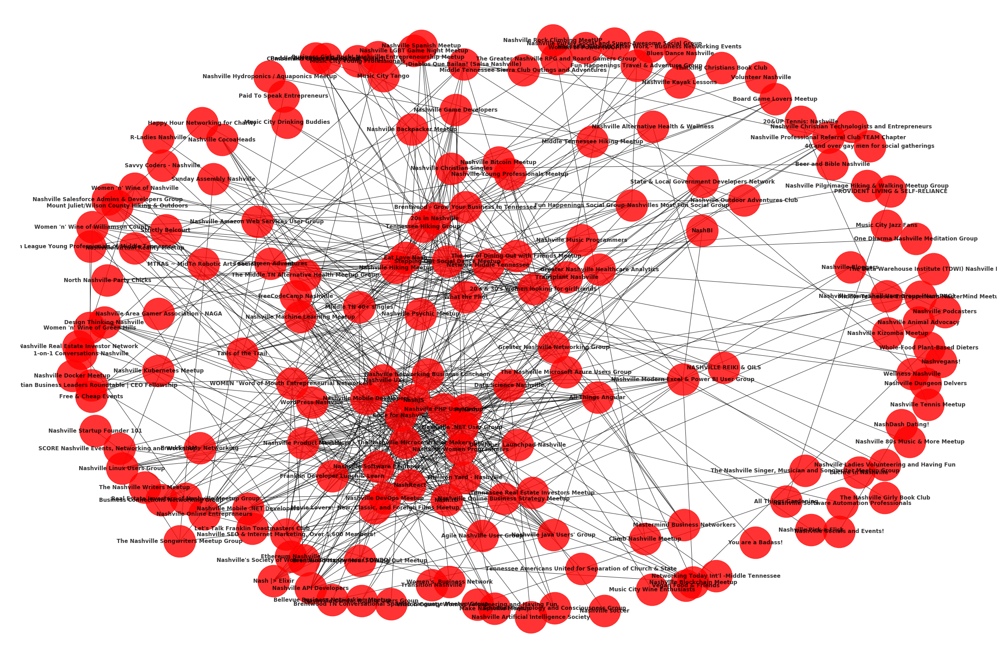

In [53]:
threshold = 5
G_subset = nx.Graph()
for row in df.index:
    source = df_meta.group_name[df_meta.group_id == df.group1[row]].values[0]
    target = df_meta.group_name[df_meta.group_id == df.group2[row]].values[0]
    weight = df.weight[row]
    if weight >= threshold:
        G_subset.add_edge(source, target, weight=weight)
edge_labels = labels = nx.get_edge_attributes(G_subset, 'weight')

plt.figure(figsize=(30,20))
nx.draw(G_subset, pos=nx.spring_layout(G_subset, k=2, seed=5), with_labels=True,
        alpha=.8, node_size=5000, font_size=12, font_weight='bold');

## Try Clustering the Network

Now, that the dataset is a little more manageable, try clustering the remaining group nodes.

In [54]:
c_gn = list(nx.algorithms.community.centrality.girvan_newman(G_subset))
for n, clusters in enumerate(c_gn):
    print(f"After removing {n} edges, there are {len(clusters)} clusters.")

After removing 0 edges, there are 8 clusters.
After removing 1 edges, there are 9 clusters.
After removing 2 edges, there are 10 clusters.
After removing 3 edges, there are 11 clusters.
After removing 4 edges, there are 12 clusters.
After removing 5 edges, there are 13 clusters.
After removing 6 edges, there are 14 clusters.
After removing 7 edges, there are 15 clusters.
After removing 8 edges, there are 16 clusters.
After removing 9 edges, there are 17 clusters.
After removing 10 edges, there are 18 clusters.
After removing 11 edges, there are 19 clusters.
After removing 12 edges, there are 20 clusters.
After removing 13 edges, there are 21 clusters.
After removing 14 edges, there are 22 clusters.
After removing 15 edges, there are 23 clusters.
After removing 16 edges, there are 24 clusters.
After removing 17 edges, there are 25 clusters.
After removing 18 edges, there are 26 clusters.
After removing 19 edges, there are 27 clusters.
After removing 20 edges, there are 28 clusters.
Afte

## Determine An Optimal Clustering Schema

Finally, determine a final clustering organization.

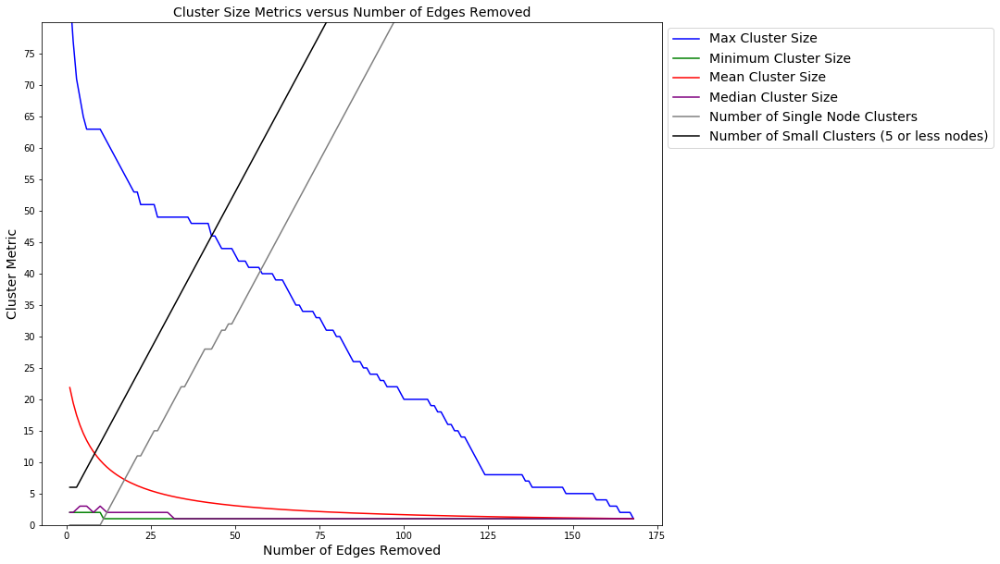

In [59]:
import numpy as np
import seaborn as sns
colors = ['blue','green','red','purple','orange','black','grey']
y = [len(cluster) for cluster in c_gn]
x = [n+1 for n in range(len(c_gn))]

fig = plt.figure(figsize=(12,10))

max_cluster_size = [max([len(c) for c in cluster]) for cluster in c_gn]
plt.plot(x,max_cluster_size, color=colors[0], label='Max Cluster Size')

min_cluster_size = [min([len(c) for c in cluster]) for cluster in c_gn]
plt.plot(x,min_cluster_size, color=colors[1], label='Minimum Cluster Size')

mean_cluster_size = [np.mean([len(c) for c in cluster]) for cluster in c_gn]
plt.plot(x,mean_cluster_size, color=colors[2], label='Mean Cluster Size')

median_cluster_size = [np.median([len(c) for c in cluster]) for cluster in c_gn]
plt.plot(x,median_cluster_size, color=colors[3], label='Median Cluster Size')

single_node_clusters = [sum([1 if len(c)==1 else 0 for c in cluster]) for cluster in c_gn]
plt.plot(x,single_node_clusters, color=colors[6], label='Number of Single Node Clusters')

small_clusters = [sum([1 if len(c)<=5 else 0 for c in cluster ]) for cluster in c_gn]
plt.plot(x,small_clusters, color=colors[5], label='Number of Small Clusters (5 or less nodes)')

plt.legend(loc=(1.01,.75), fontsize=14)
plt.title('Cluster Size Metrics versus Number of Edges Removed', fontsize=14)
plt.xlabel('Number of Edges Removed', fontsize=14)
plt.ylabel('Cluster Metric', fontsize=14)
plt.ylim(0,80)
plt.yticks(ticks=list(range(0,80,5)))
plt.show();


## Visualize the Clusters

Analyze the output of your clustering schema. Do any clusters of groups stand out to you?

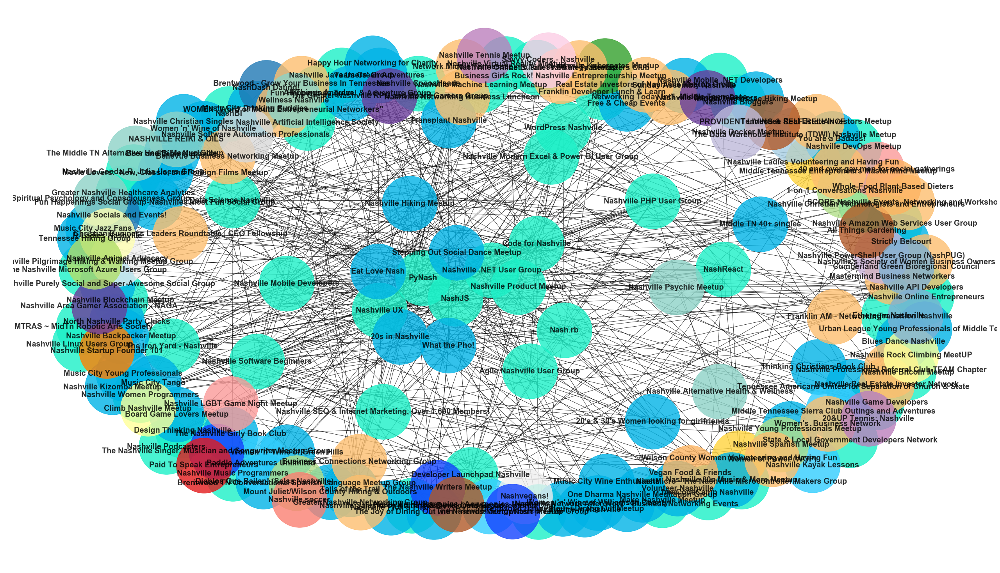

In [63]:
def plot_girvan_newman(G, clusters):
    """
    G: a NetworkX Graph object
    clusters: one of the clusters from a Girvan-Newman output
    """
    import warnings
    warnings.filterwarnings('ignore')
    colors = ["#1cf0c7","#ffd43d","#00b3e6","#32cefe","#efefef",
          "#1443ff","#a6cee3","#1f78b4","#b2df8a","#33a02c","#fb9a99",
          "#e31a1c","#fdbf6f","#ff7f00","#cab2d6","#6a3d9a","#ffff99",
          "#b15928","#8dd3c7","#ffffb3","#bebada","#fb8072","#80b1d3",
          "#fdb462","#b3de69","#fccde5","#d9d9d9","#bc80bd","#ccebc5",
          "#ffed6f","#bf812d","#dfc27d","#f6e8c3","#f5f5f5","#c7eae5",
          "#80cdc1", "#35978f", "#01665e", "#003c30"]
    fig = plt.figure(figsize=(35,20))
    for n, ci in enumerate(clusters):
        ci = G.subgraph(ci)
        nx.draw(ci, pos=nx.spring_layout(G, k=3.6, seed=3), 
                with_labels=True, node_color=colors[n],
                alpha=.8, node_size=20000, font_weight="bold", font_size=20)
    plt.show();


sns.set_style('white')
plot_girvan_newman(G_subset, c_gn[20])

In [71]:
#Because the Network is still dense and names are long, organizing the clusters as a Pandas dataframe is appropriate
clusters = pd.DataFrame(list(c_gn[20])).transpose()
clusters.columns = ["Cluster{}".format(i) for i in range(1,len(clusters.columns)+1)]
clusters.head()

#Many of the clusters are easily identifiable;
#You can see that cluster 1 is a technology group,
#cluster 2 is a social hodgepodge,
#cluster4 is outdoor enthusiasts,


,Cluster1,Cluster2,Cluster3,Cluster4,Cluster5,Cluster6,Cluster7,Cluster8,Cluster9,Cluster10,...,Cluster19,Cluster20,Cluster21,Cluster22,Cluster23,Cluster24,Cluster25,Cluster26,Cluster27,Cluster28
0,Code for Nashville,Nashville Ladies Volunteering and Having Fun,¡Diablos Que Bailan! (Salsa Nashville),Nashville Kayak Lessons,Nashvegans!,"The Nashville Singer, Musician and Songwriter ...",The Data Warehouse Institute (TDWI) Nashville ...,NashDash Dating!,1-on-1 Conversations Nashville,Nashville Kubernetes Meetup,...,Spiritual Psychology and Consciousness Group,R-Ladies Nashville,Nashville Docker Meetup,Nashville soccer,Cumberland Green Bioregional Council,Vegan Food & Friends,Nashville Pilgrimage Hiking & Walking Meetup G...,Savvy Coders - Nashville,Nashville Software Automation Professionals,Nashville Tennis Meetup
1,All Things Angular,Wilson County Women Volunteering and Having Fun,Women 'n' Wine of Green Hills,Middle Tennessee Sierra Club Outings and Adven...,Nashville Animal Advocacy,The Nashville Songwriters Meetup Group,None,Nashville Socials and Events!,Brentwood TN Conversational Spanish Language M...,None,...,Nashville Psychic Meetup,None,None,None,Transition Nashville,Whole-Food Plant-Based Dieters,None,None,None,20&UP Tennis: Nashville
2,Nashville Virtual Reality Meetup,None,One Dharma Nashville Meditation Group,Nashville Outdoor Adventures Club,None,The Nashville Writers Meetup,None,None,Nashville Spanish Meetup,None,...,Wellness Nashville,None,None,None,None,None,None,None,None,None
3,Nashville Online Business Strategy Meetup,None,Urban League Young Professionals of Middle Ten...,Paddle Adventures Unlimited,None,None,None,None,None,None,...,The Middle TN Alternative Health Meetup Group,None,None,None,None,None,None,None,None,None
4,freeCodeCamp Nashville,None,"Movie Lovers: New, Classic, and Foreign Films...",None,None,None,None,None,None,None,...,Nashville Alternative Health & Wellness,None,None,None,None,None,None,None,None,None


## Summary

In this lab, you got another chance to practice your network clustering skills, investigating a meetup dataset of events and groups surrounding the Nashville area. If you're up for the challenge, feel free to continue investigating the dataset and trying to cluster users or events!                                                                                                                                                               